<a href="https://colab.research.google.com/github/TanD18/Transliteration-enc-dec-model-/blob/main/Trans_Literation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Dataset source

https://github.com/anoopkunchukuttan/crowd-indic-transliteration-data

##Import Library

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import random

In [7]:
import torch
from torch.utils.data import Dataset
import torch.nn as nn
import torch.nn.functional as F
from tqdm.notebook import tqdm

In [8]:
from torch.cuda import is_available
device_gpu=torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [9]:
# from google.colab import drive
# drive.mount('/content/drive')

##Pre-processing

In [10]:
with open('/content/drive/MyDrive/English-Hindi Transliteration.txt') as f:
  transliteration_file=f.read()

###Variable Description



*   **transliteration_file**: containing the text data in raw format

*   **transliteration_list**: containg hindi-english parallels (separated by '\t')


*   **eng_string**:containg all the english words joined together in one string


*   **hin_string**:containing all the hindi words joined together in one string

*   **eng_list**: list containing each eng word as the element (sequence maintained)
*   **hin_list**:list containing each hindi word as the element (sequence maintained)


*   **processed_eng_list**: containing only English alphabets (A-Z)

*   **processed_hin_list**: containing only hindi words (only hindi alphabets)






In [13]:
def get_lang_list(transliteration_list):
  eng_list, hin_list=[],[]
  for i in transliteration_list:
    eng_list.append(i.split('\t')[0])
    hin_list.append(i.split('\t')[1])
  return eng_list,hin_list

In [14]:
#Making the List of Hindi Alphabets to be used
def get_hindi_alphabets():
  hindi_alphabets=['<pad>']
  for i in range(2304,2432):
    hindi_alphabets.append(chr(i))
  return hindi_alphabets

In [15]:
def non_eng_char_removal(eng_list):
  non_eng_char=re.compile('[^A-Z]')
  processed_eng_list=[]
  for word in eng_list:
    processed_eng_list.append(non_eng_char.sub('',word.upper()))
  return processed_eng_list

In [16]:
def non_hindi_char_removal(hin_list,hindi_alphabets):
  processed_hin_list=[]
  for word in hin_list:
    processed_word=''
    for char in word:
      if char in hindi_alphabets:
        processed_word+=char
    processed_hin_list.append(processed_word)
  return processed_hin_list

In [17]:
eng_alphabets=['<pad>','A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z']
hin_alphabets=get_hindi_alphabets()
len(eng_alphabets),len(hin_alphabets)

(27, 129)

###Preprocessing Function

In [18]:
def preprocess(transliteration_file):

  #Removing the start sequence indicators '\ut...'
  transliteration_File=transliteration_file[1:]

  #Splitting text into parts containing parallel eng-hindi phoneme
  transliteration_list=transliteration_File.split('\n')

  #Get the list of all hindi characters
  hindi_alphabets=get_hindi_alphabets()

  #Making list of each hindi and english words (sequenc is maintained)
  eng_list,hin_list=get_lang_list(transliteration_list)

  #Removing non alphabetic characters from the english and hindi list of words
  #English words are changed to upper case
  processed_eng_list=non_eng_char_removal(eng_list)
  processed_hin_list=non_hindi_char_removal(hin_list,hindi_alphabets)
  
  return processed_eng_list,processed_hin_list,eng_list,hin_list

##Dataloader Class

In [19]:
class Transliteration_DataLoader(Dataset):
  def __init__(self,transliteration_file):
    processed_eng_list,processed_hin_list,eng_list,hin_list=preprocess(transliteration_file)
    self.eng_words=processed_eng_list
    self.hin_words=processed_hin_list

  def __len__(self):
    return len(self.eng_words)

  def __get_item__(self,index):
    return self.eng_words[index],self.hin_words[index]

  def get_random_sample(self):
    return self.__get_item__(np.random.randint(len(self.eng_words)))

  def get_batch(self,batch_size):
    random_index=random.sample(range(0,len(self.eng_words)),batch_size)
    return [[self.eng_words[i],self.hin_words[i]] for i in random_index]

##Encoded Representation

In [20]:
def word_rep(words,max_len,lang_alphabets,device='cpu'):
  word_rep=torch.zeros(len(words),max_len+1,len(lang_alphabets)).to(device)
  for b in range(len(words)):
    index=-1
    for index,char in enumerate(words[b]):
      char_pos=lang_alphabets.index(char)
      word_rep[b][index][char_pos]=1

    pad_pos=lang_alphabets.index('<pad>')
    word_rep[b][index+1][pad_pos]=1

  return word_rep

##Network Architecture

###Model

In [21]:
MAX_OUTPUT_CHARS=50
class Transliteration_Encoder_Decoder_Attention(nn.Module):
  
  def __init__(self,input_size,hidden_size,output_size,num_layers=1,dropout=0,verbose=False):
    super(Transliteration_Encoder_Decoder_Attention,self).__init__()

    self.hidden_size=hidden_size
    self.output_size=output_size
    self.num_layers=num_layers
    self.verbose=verbose
    
    self.encoder_rnn_cell=nn.GRU(input_size=input_size,hidden_size=hidden_size,num_layers=num_layers,dropout=0,batch_first=True)
    self.decoder_rnn_cell=nn.GRU(input_size=hidden_size*2,hidden_size=hidden_size,num_layers=num_layers,dropout=0,batch_first=True)

    self.U=nn.Linear(hidden_size,hidden_size)
    self.W=nn.Linear(hidden_size,hidden_size)
    self.att=nn.Linear(hidden_size,1)
    self.o2i=nn.Linear(self.output_size,self.hidden_size)
    self.dropout=nn.Dropout(dropout)

    self.h2o=nn.Linear(hidden_size,output_size)
    self.softmax=nn.LogSoftmax(dim=2)

  def forward(self,input,max_len,batch_size=1,ground_truth=None,device='cpu'):
    
    #Encoder
    out,hidden=self.encoder_rnn_cell(input)
    encoder_outputs=out
    if self.verbose:
      print("Input Size",input.size())
      print("encoder output",out.size())
      print("ecnoder hidden",hidden.size())

    #Decoder
    decoder_state=self.dropout(hidden)
    decoder_input=torch.zeros(encoder_outputs.size()[0],1,self.output_size).to(device)     #It could initialized to a values which can be learned from training
    outputs=torch.empty(encoder_outputs.size()[0],self.output_size,1).to(device)
    U=self.U(encoder_outputs)
    if self.verbose:
      print("U Size ",U.data.size())
    
    for i in range(max_len):

      decoder_input=decoder_input.to(device)
      W=self.W(decoder_state[-1:,:,:]).view(-1,1,U.size()[2]).repeat(1,U.size()[1],1)
      V=self.att(torch.tanh(U+W))

      att_weights=F.softmax(V.view(V.size()[0],1,-1),dim=2)
      att_applied=torch.bmm(att_weights,encoder_outputs.view(V.size()[0],-1,self.hidden_size))

      embeddings=self.o2i(decoder_input)
      decoder_input=torch.cat((embeddings,att_applied),dim=2)

      

      if self.verbose:
        print("W Size ",W.size())
        print("V Size ",V.size())
        print("att weights size",att_weights.size())
        print("encoder weight ",encoder_outputs[1].size())
        print("attention applied size",att_applied.size())
        print("Embeddings size",embeddings.size())
        print("Decoder Input size",decoder_input.size())
        print("Decoder State",decoder_state.size())


      out,decoder_state=self.decoder_rnn_cell(decoder_input,decoder_state)


      if self.verbose:
        print("Decoder Intermediate Output",out.shape)

      out=self.h2o(out)
      out=self.softmax(out)
      outputs=torch.cat((outputs,out.view(input.size()[0],-1,1)),dim=2)
      max_id=torch.argmax(out,dim=2)

      if self.verbose:
        print("decoder input",decoder_input.size())
        print("output from Decoder",out.size())
        print("Output ",out)
        print("output with (1,-1) view",out.view(input.size()[0],-1).size())
        print("Max indices from output(keep dim)",torch.argmax(out,dim=2,keepdim=True))
        print("Size of Outputs of the Decoder",len(outputs))
      
      if not ground_truth is None:          #Teacher forcing applied

        decoder_input=ground_truth[:,i,:].unsqueeze(1).detach()

      else:                                 #Teacher Forcing not applied
        max=torch.argmax(outputs[:,:,-1],dim=1)
        ten=torch.zeros(out.size())
        ten[0][0][max]=1
        decoder_input=ten

    return outputs[:,:,1:]

In [22]:
def train_a_batch(net,opt,dataloader,criterion,batch_size,teacher_forcing=0,device='cpu'):  
  
  net.train().to(device)
  trans_batch=dataloader.get_batch(batch_size)
  eng_words , hin_words= [i[0] for i in trans_batch] , [i[1] for i in trans_batch]
  eng_len , hin_len=[len(i) for i in eng_words],[len(i) for i in hin_words]

  eng_rep=word_rep(eng_words,max(eng_len),eng_alphabets).to(device)
  hin_rep=word_rep(hin_words,max(hin_len),hin_alphabets)
  true_rep=None
  if (np.random.random()<teacher_forcing):
    true_rep=hin_rep

  batch_truth=[]
  for i in hin_words:
    word_truth=[hin_alphabets.index(char) for char in i]
    for j in range((max(hin_len)+1)-len(word_truth)):
      word_truth.append(hin_alphabets.index('<pad>'))
    batch_truth.append(word_truth)
  batch_truth=torch.tensor(batch_truth).to(device)

  batched_output=net.forward(eng_rep,batch_size=batch_size,ground_truth=true_rep,max_len=max(hin_len)+1,device=device)
  out_size=batched_output.size()
  truth_size=batch_truth.size()
  loss=criterion(batched_output,batch_truth)
  loss.backward()
  opt.step()

  return loss

In [40]:
def eval(net,n_points,device='cpu'):

  net.eval().to(device)
  dataloader=Transliteration_DataLoader(transliteration_file)
  trans_batch=dataloader.get_batch(n_points)
  eng_words , hin_words= [i[0] for i in trans_batch] , [i[1] for i in trans_batch]
  eng_len , hin_len=[len(i) for i in eng_words],[len(i) for i in hin_words]


  eng_rep=word_rep(eng_words,max(eng_len),eng_alphabets).to(device)
  hin_rep=word_rep(hin_words,max(hin_len),hin_alphabets)

  batch_truth=[]
  for i in hin_words:
    word_truth=[hin_alphabets.index(char) for char in i]
    for j in range((max(hin_len)+1)-len(word_truth)):
      word_truth.append(hin_alphabets.index('<pad>'))
    batch_truth.append(word_truth)
  batch_truth=torch.tensor(batch_truth).to(device)
  correct=0
  total_letters=0
  for i in range(len(eng_rep)):
    # print(eng_words[i],hin_words[i])
    batched_output=net.forward(eng_rep[i].unsqueeze(0),batch_size=1,ground_truth=hin_rep[i].unsqueeze(0),max_len=hin_len[i]+1,device=device)
    output=batched_output.view(batched_output.size()[1],-1).permute(1,0)


    for index,letter in enumerate(output):
      total_letters+=1
      # print("Predicted",hin_alphabets[torch.argmax(letter)])
      # print("Truth",hin_alphabets[batch_truth[i][index]])
      if torch.argmax(letter)==batch_truth[i][index]:
        correct+=1
  return correct/total_letters

In [24]:
n_hidden=1024
num_layers=1
net_test2=Transliteration_Encoder_Decoder_Attention(len(eng_alphabets),n_hidden,len(hin_alphabets),num_layers=num_layers,dropout=0,verbose=False)
eval(net_test2,1)

IN EVAL cpu
SHIKEESHIMAA शिकीशिमा
Predicted ॊ
Truth श
Predicted ए
Truth ि
Predicted ए
Truth क
Predicted ॷ
Truth ी
Predicted ॷ
Truth श
Predicted ॷ
Truth ि
Predicted ए
Truth म
Predicted ए
Truth ा
Predicted ॷ
Truth <pad>


0.0

In [25]:
def predict(net,word,device='cpu'):

  net.eval().to(device)
  eng_rep=word_rep([word],len(word),eng_alphabets).to(device)
  batched_output=net.forward(eng_rep[0].unsqueeze(0),batch_size=1,ground_truth=None,max_len=10,device=device)
  output=batched_output.view(batched_output.size()[1],-1).permute(1,0)
  hin_word=""
  
  for i in range(len(eng_rep)):
    batched_output=net.forward(eng_rep[i].unsqueeze(0),batch_size=1,ground_truth=None,max_len=10,device=device)
    output=batched_output.view(batched_output.size()[1],-1).permute(1,0)

    for index,letter in enumerate(output):
      if hin_alphabets[torch.argmax(letter)]=='<pad>':
        break
      hin_word+=hin_alphabets[torch.argmax(letter)]

  return hin_word

In [34]:
PATH="/content/drive/MyDrive/Translit-working 2"
net_test2.load_state_dict(torch.load(PATH,map_location=device_gpu))

<All keys matched successfully>

In [41]:
#net_test3=Transliteration_Encoder_Decoder_Attention(len(eng_alphabets),512,len(hin_alphabets),num_layers=1,verbose=False)
eval(net_test2,1000,device_gpu)

0.6631530705774519

In [28]:
def train_setup(net,opt,n_batches=100,batch_size=10,teacher_forcing=0,momentum=0.05,display_frequency=5,device='cpu',model_num='zomato A'):
  net=net.to(device)
  loss_fn=nn.NLLLoss()
  loss_plot=[]
  dataloader=Transliteration_DataLoader(transliteration_file)
  loss_arr=np.zeros(n_batches)

  for i in tqdm(range(n_batches),desc='Batch Completion'):
    loss_arr[i]=train_a_batch(net,opt,dataloader,loss_fn,batch_size,teacher_forcing,device=device)
    
    if i%display_frequency==0:
      if i==0:
        loss_plot.append(loss_arr[i])
      else:
        loss_plot.append(sum(loss_arr[i-display_frequency:i])/display_frequency)
      
      plt.plot(loss_plot)
      plt.show()
    
    if (i+1)%5000==0:
      PATH="/content/drive/MyDrive/"+model_num+"-"+str(i)
      torch.save(net.state_dict(), PATH)
      print("model saved version : ",(i+1)/5000)
  
  return loss_arr

##Evaluate

In [29]:
n_hidden=1024
num_layers=1
net_test2=Transliteration_Encoder_Decoder_Attention(len(eng_alphabets),n_hidden,len(hin_alphabets),num_layers=num_layers,dropout=0,verbose=False)
criterion=nn.NLLLoss()

Batch Completion:   0%|          | 0/500000 [00:00<?, ?it/s]

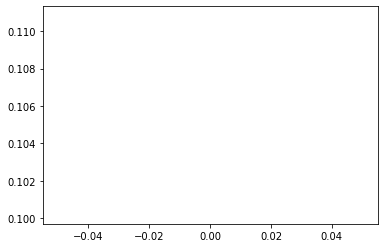

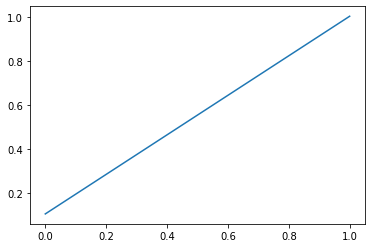

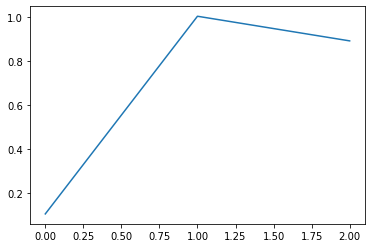

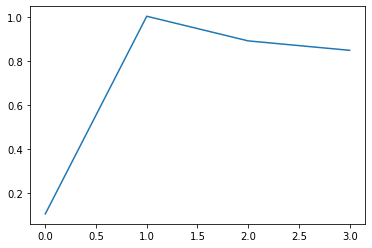

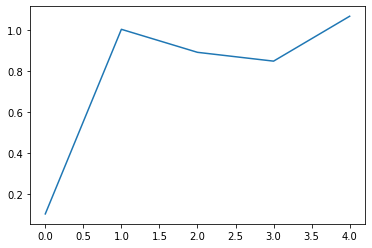

...

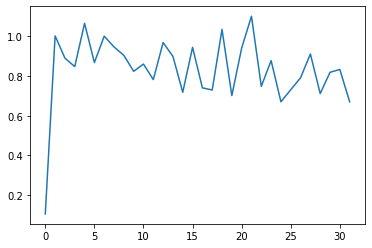

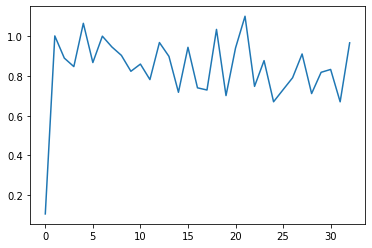

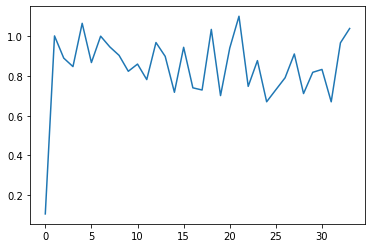

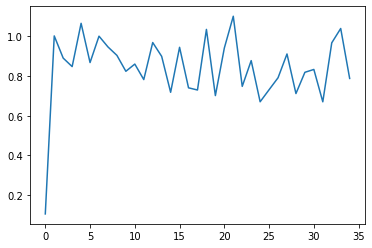

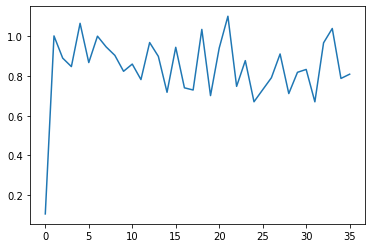

model saved version :  1.0


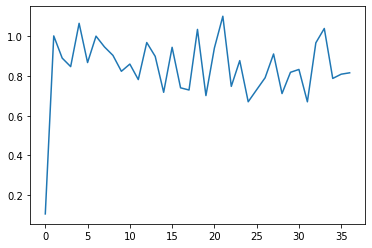

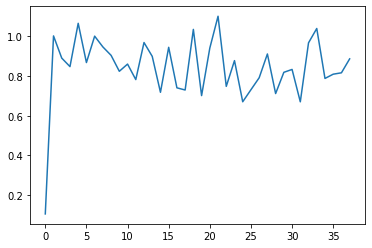

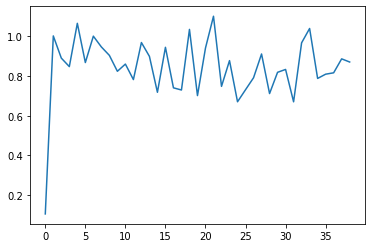

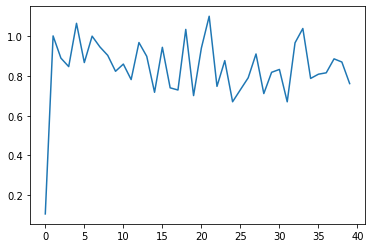

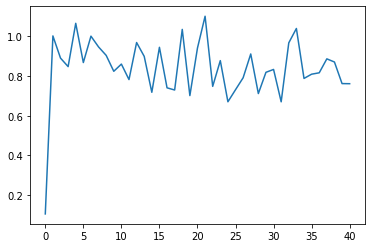

...

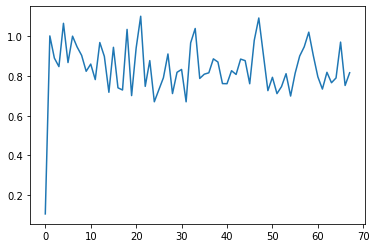

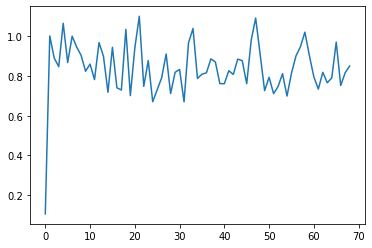

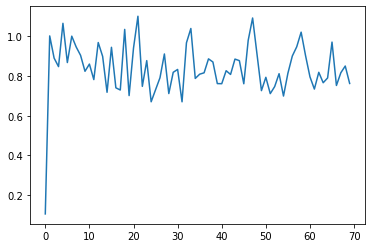

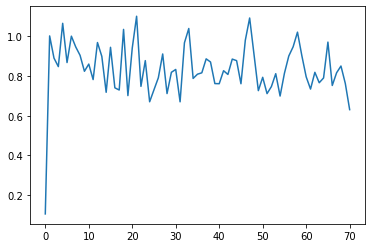

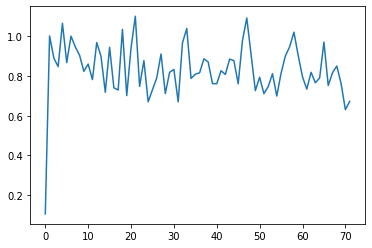

model saved version :  2.0


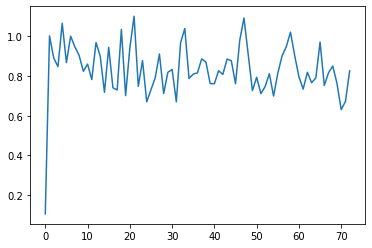

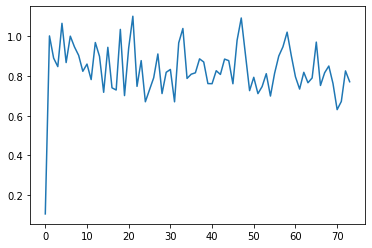

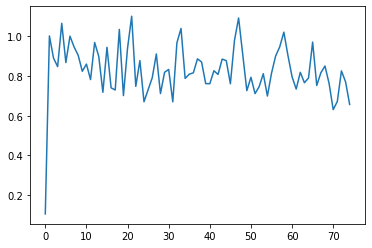

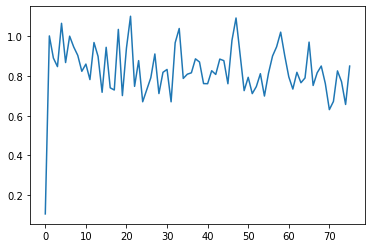

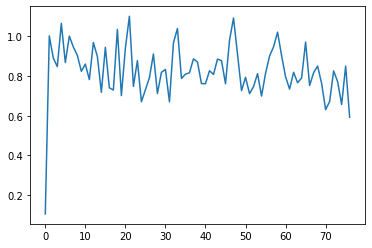

...

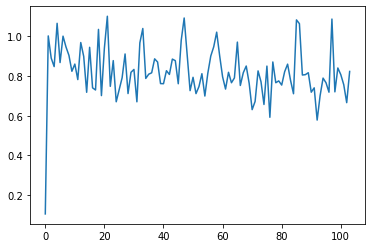

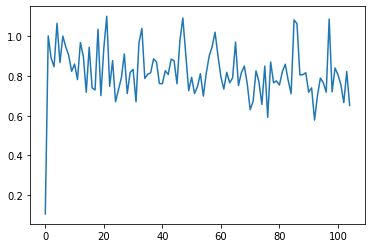

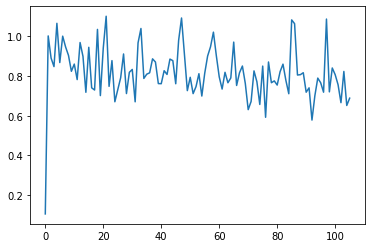

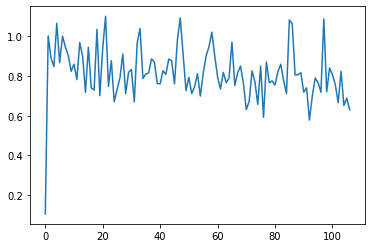

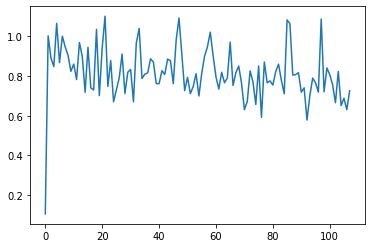

model saved version :  3.0


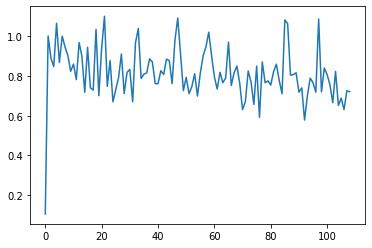

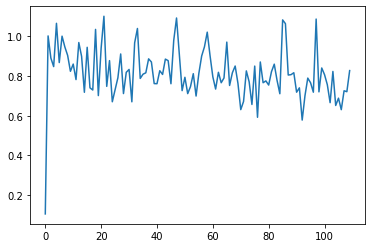

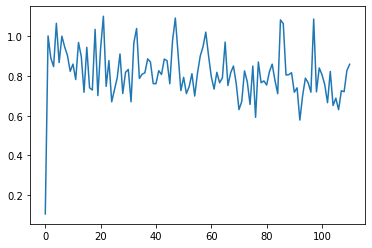

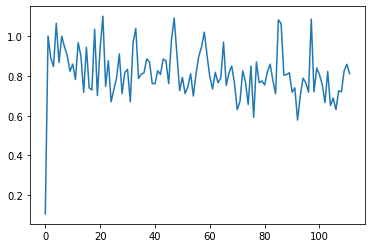

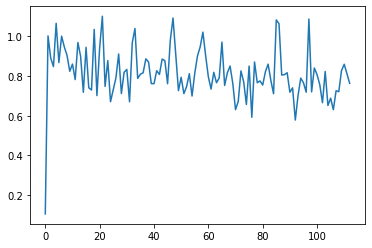

...

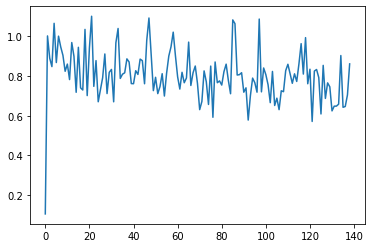

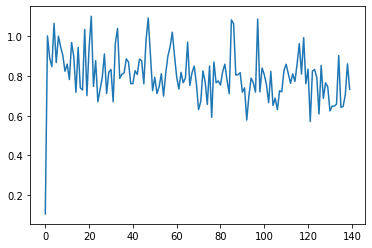

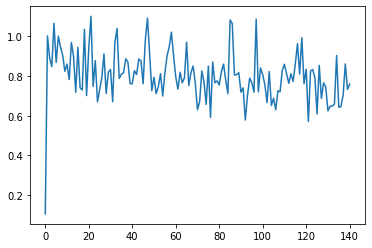

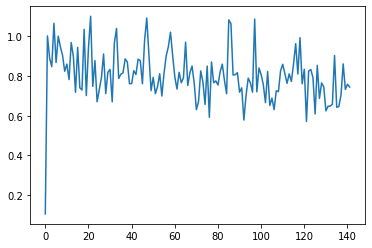

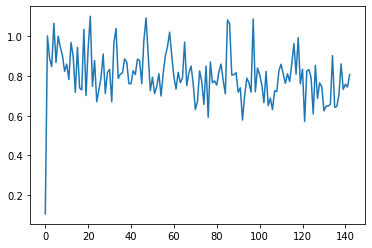

model saved version :  4.0


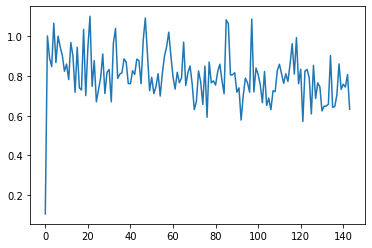

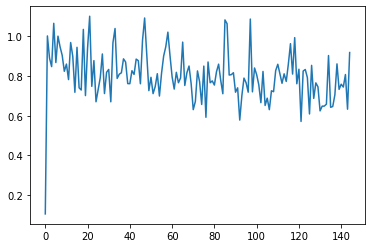

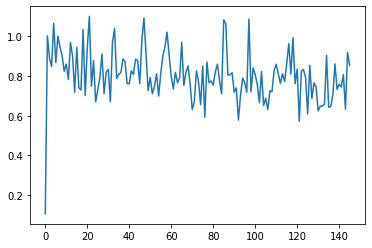

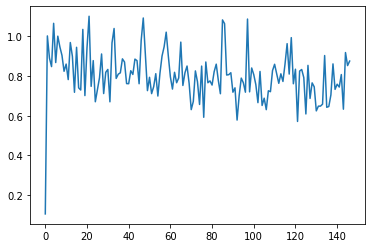

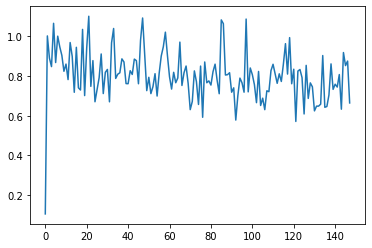

...

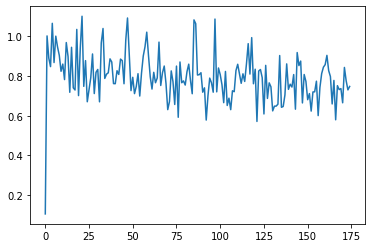

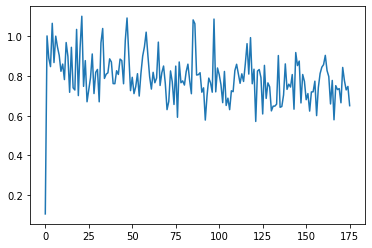

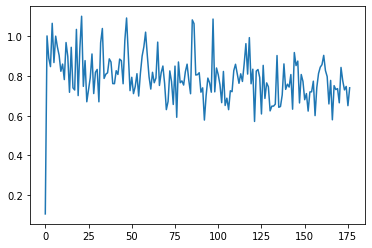

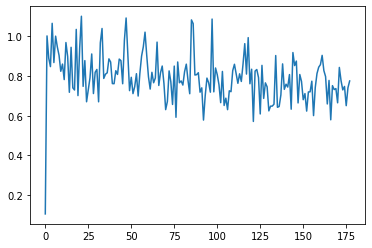

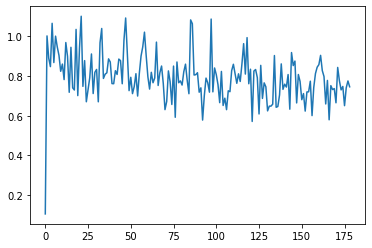

model saved version :  5.0


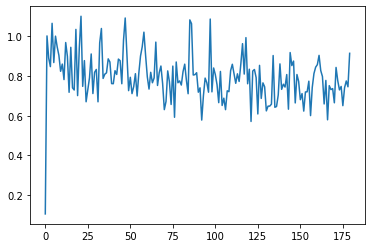

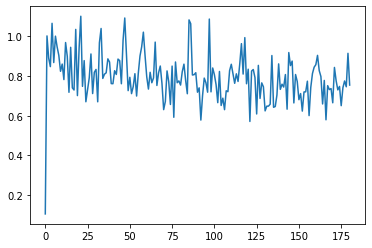

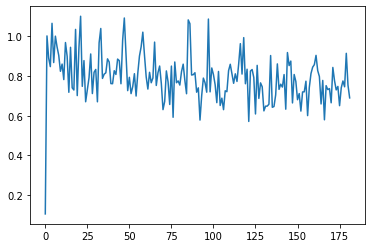

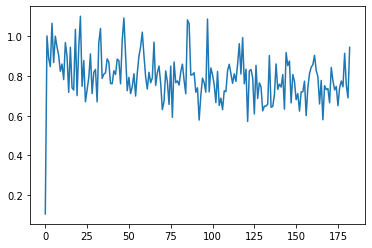

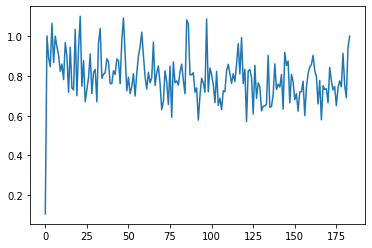

...

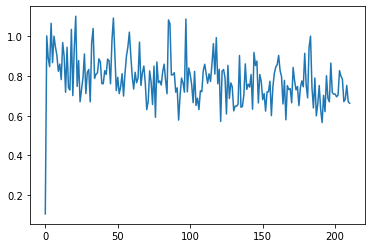

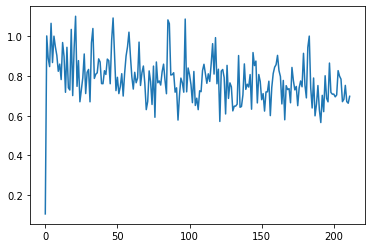

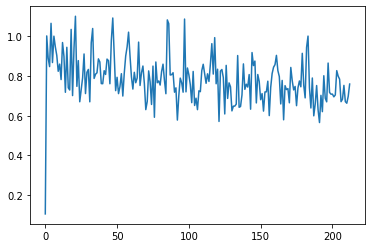

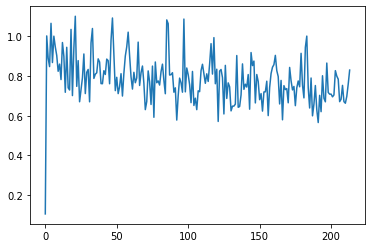

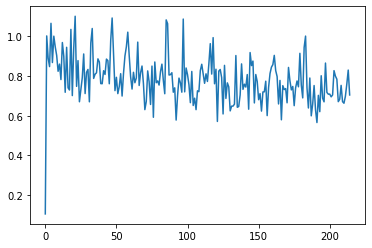

model saved version :  6.0


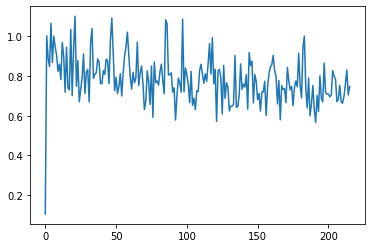

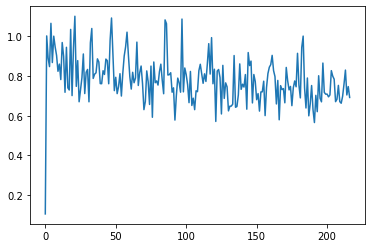

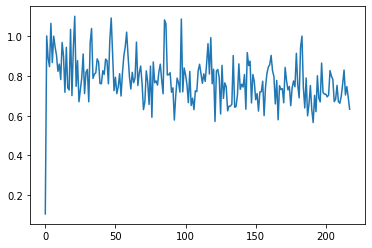

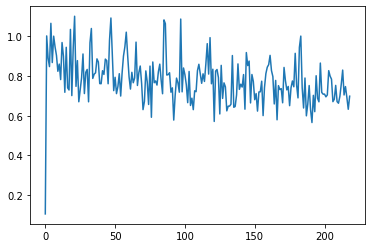

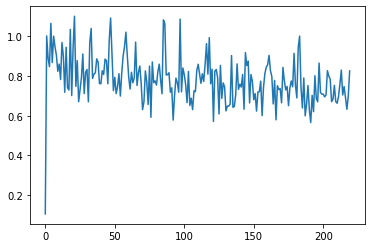

...

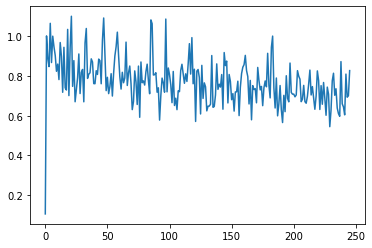

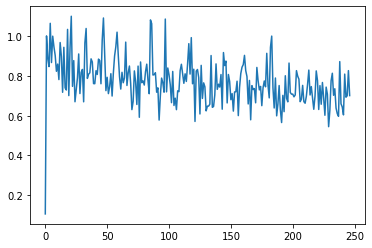

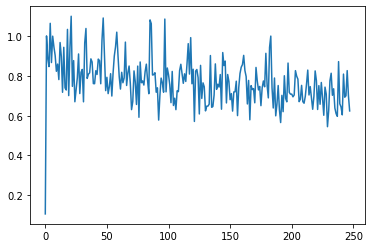

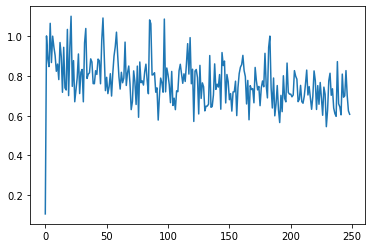

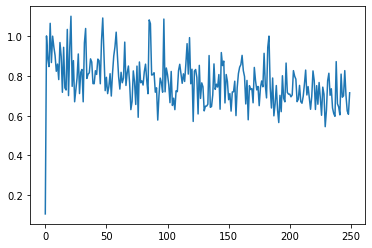

model saved version :  7.0


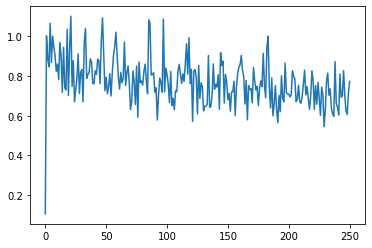

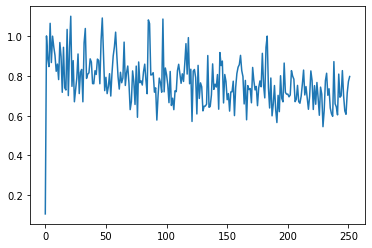

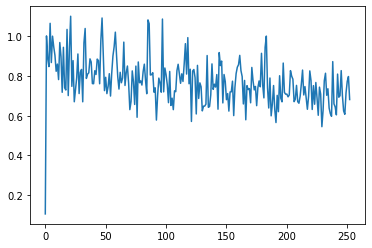

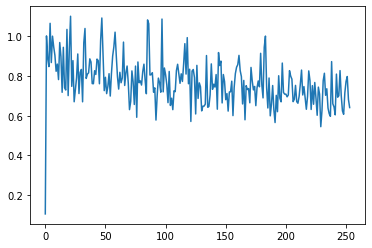

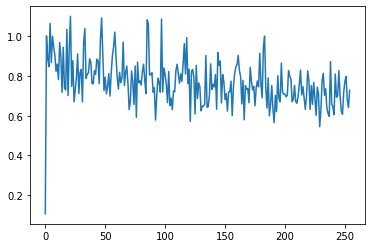

...

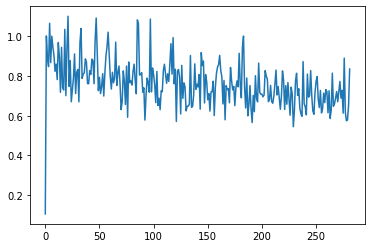

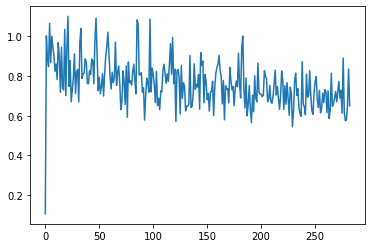

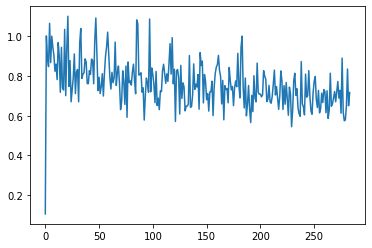

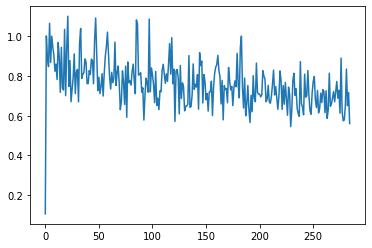

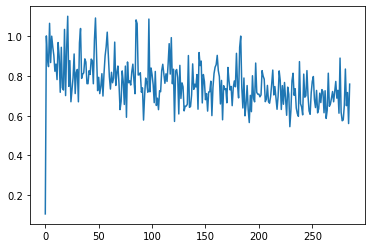

model saved version :  8.0


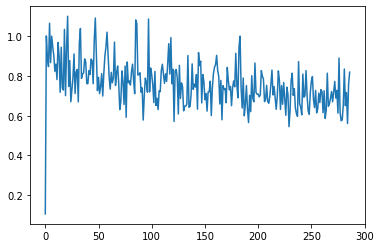

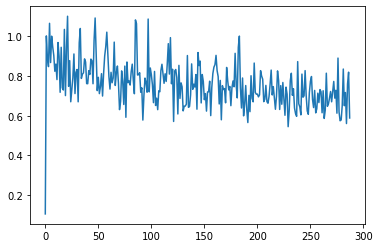

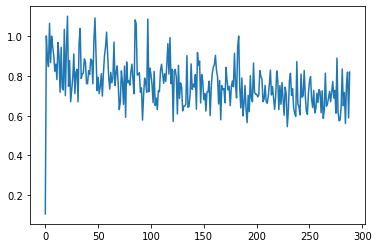

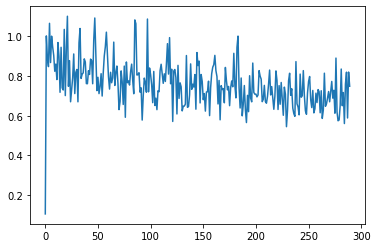

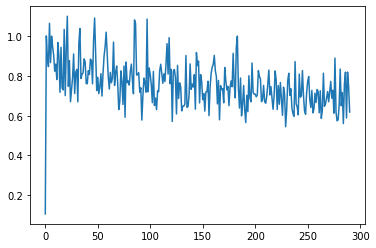

...

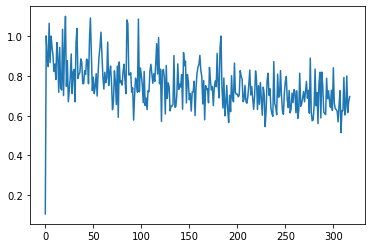

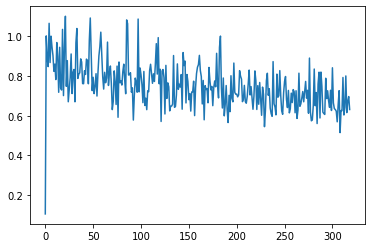

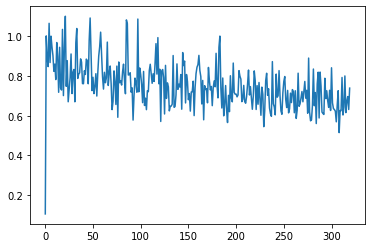

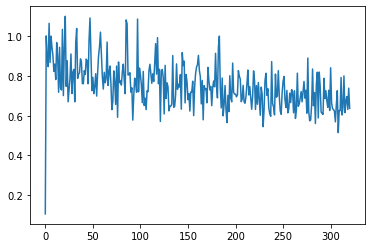

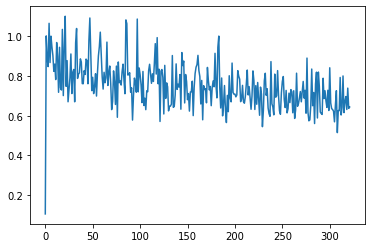

model saved version :  9.0


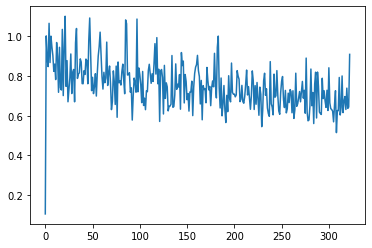

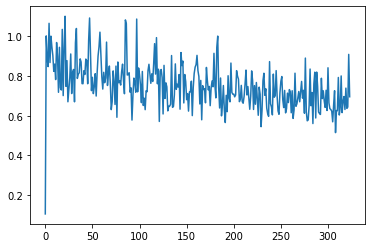

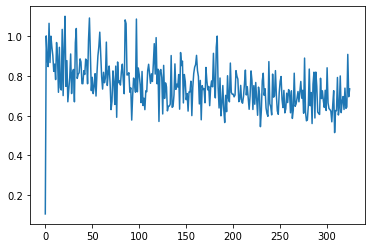

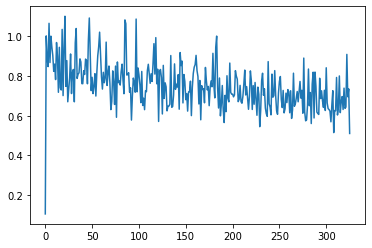

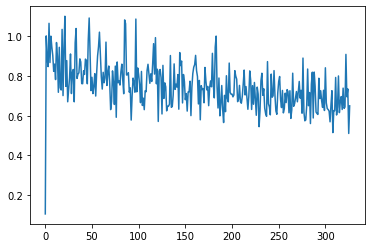

...

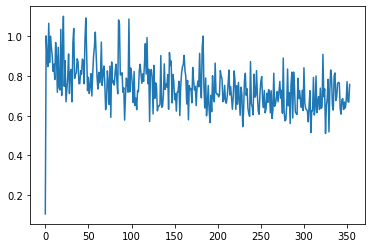

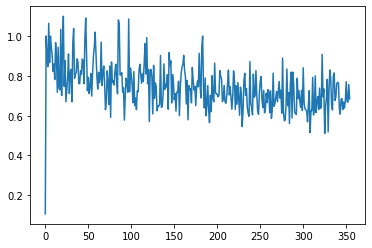

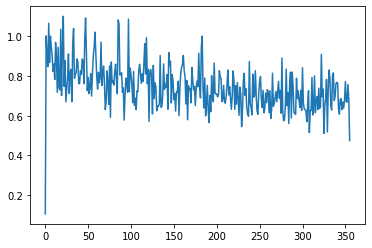

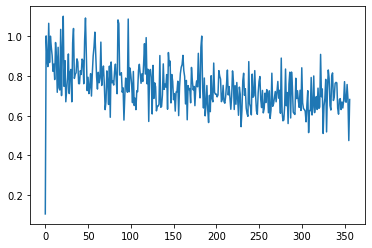

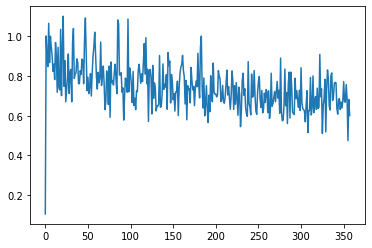

model saved version :  10.0


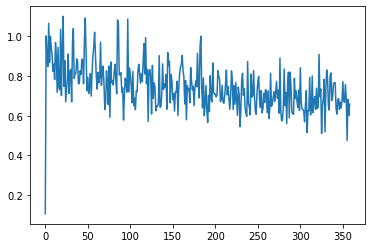

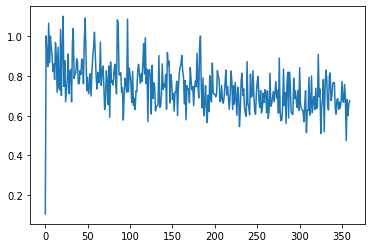

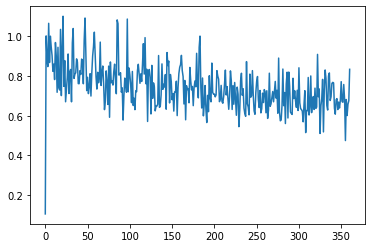

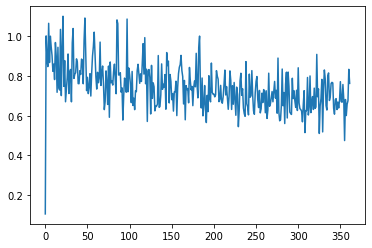

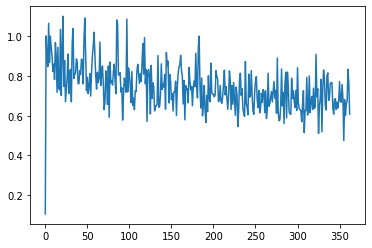

...

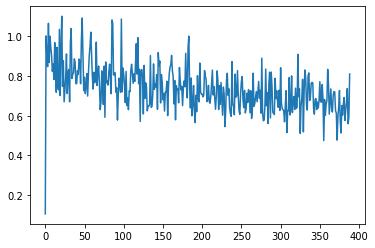

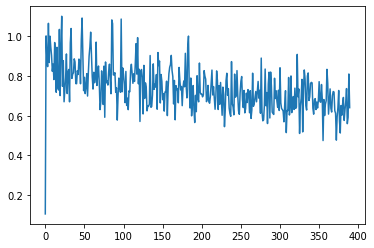

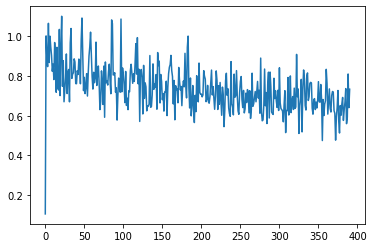

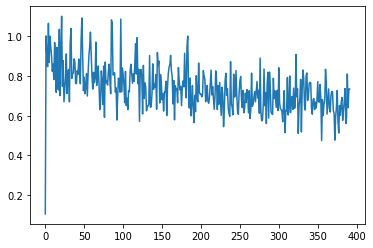

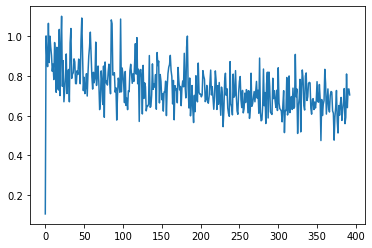

model saved version :  11.0


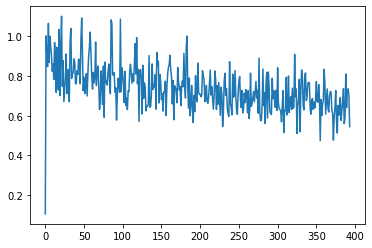

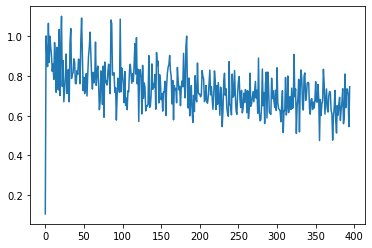

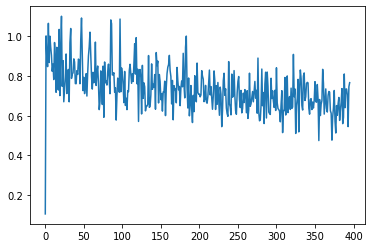

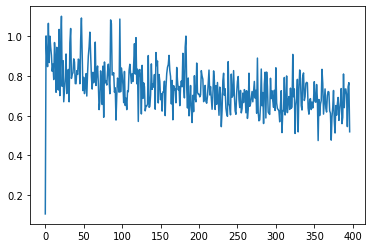

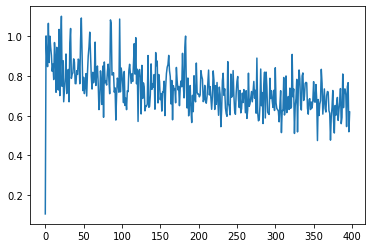

...

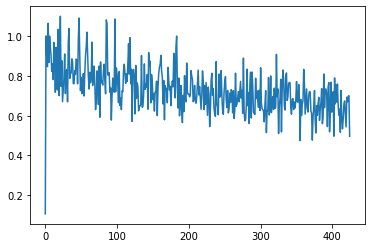

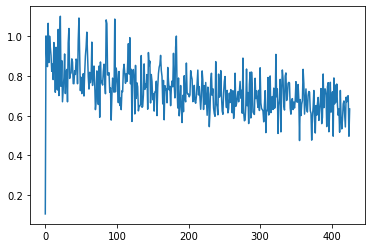

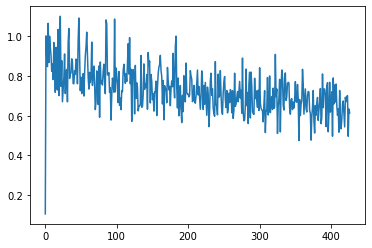

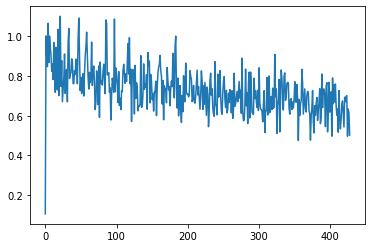

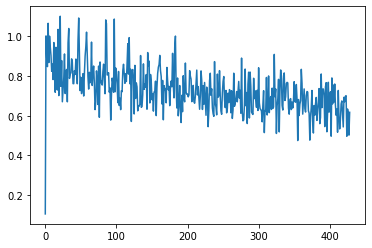

model saved version :  12.0


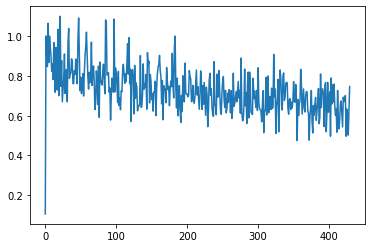

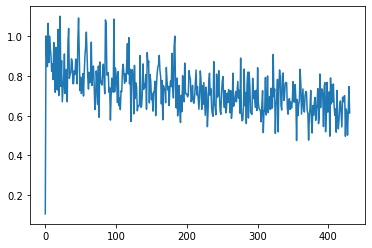

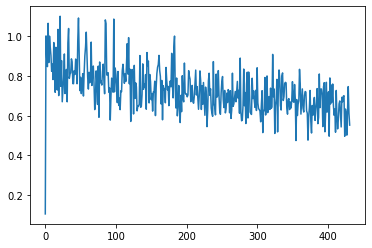

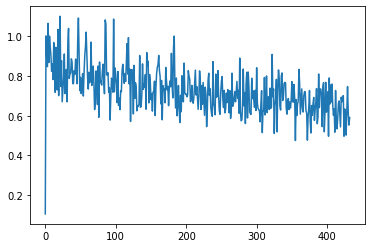

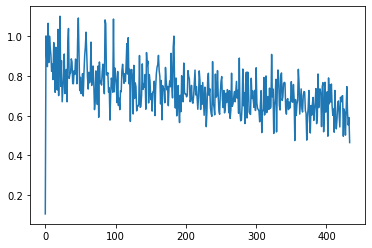

...

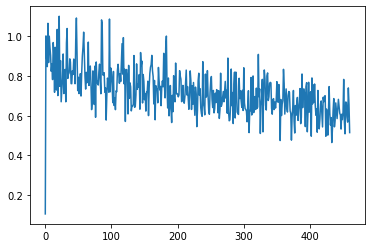

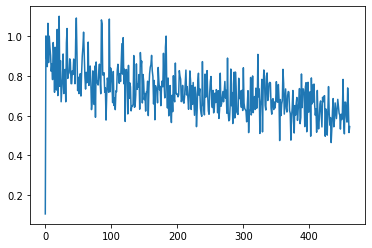

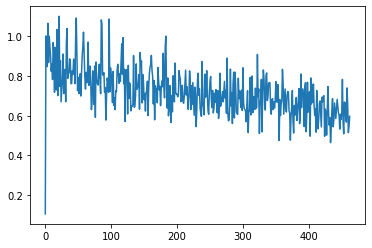

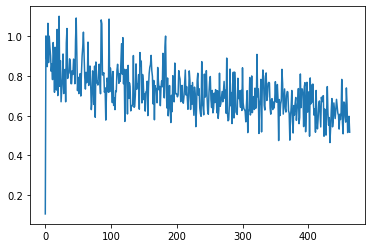

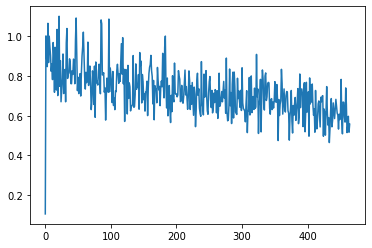

model saved version :  13.0


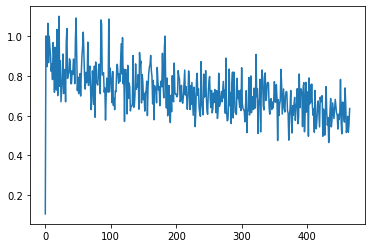

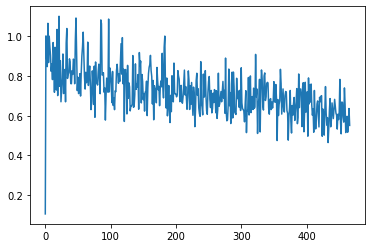

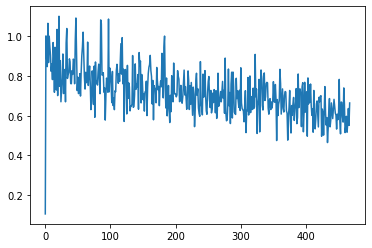

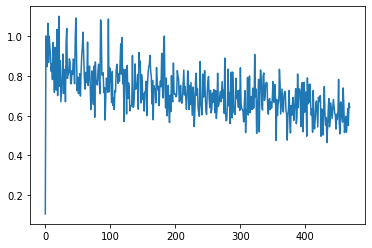

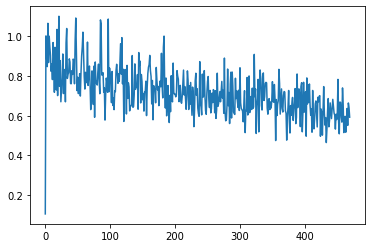

...

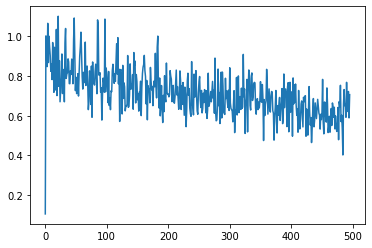

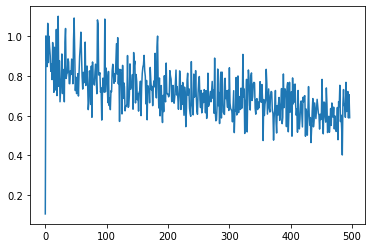

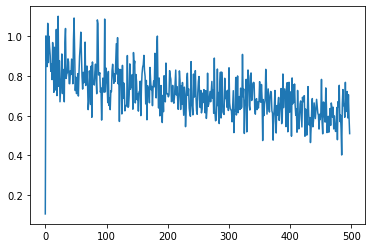

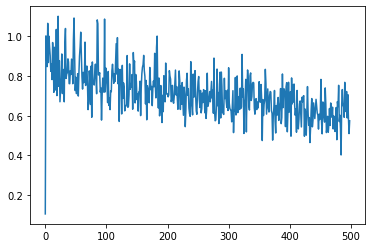

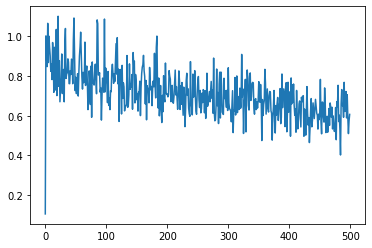

model saved version :  14.0


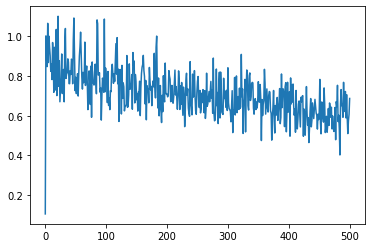

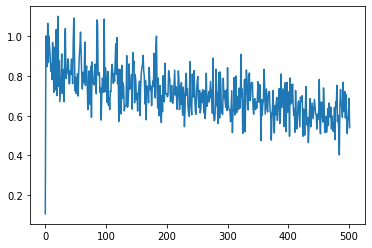

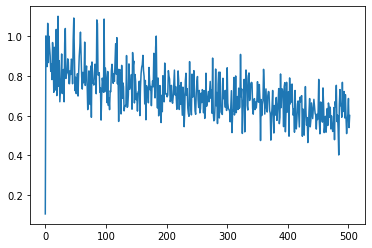

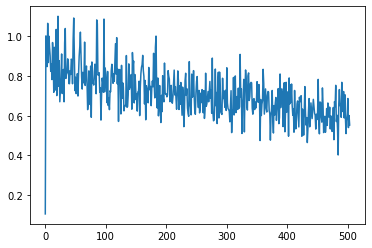

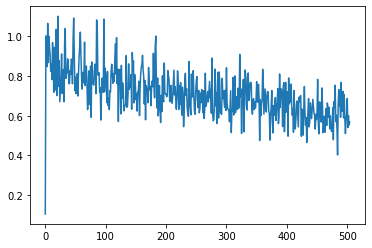

...

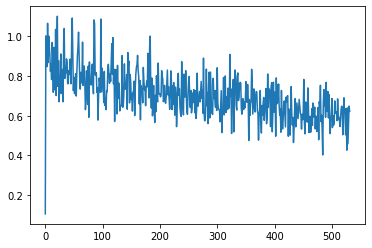

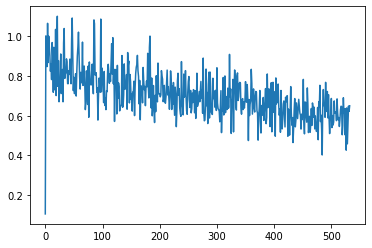

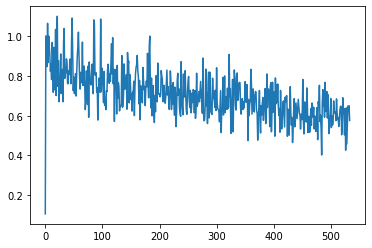

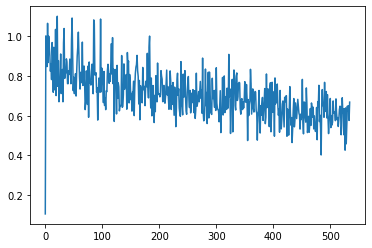

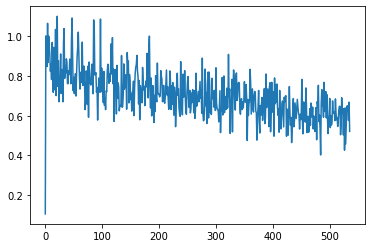

model saved version :  15.0


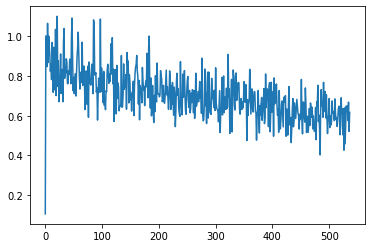

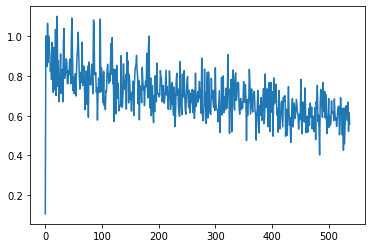

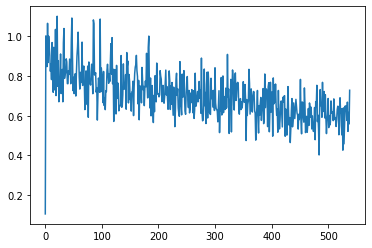

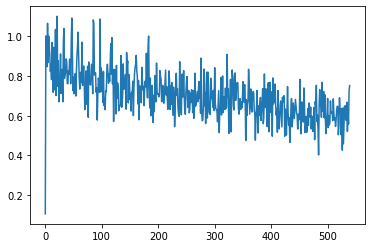

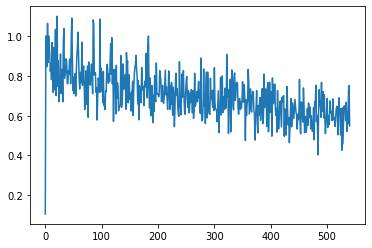

...

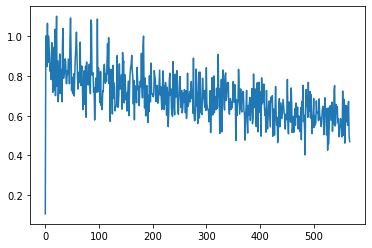

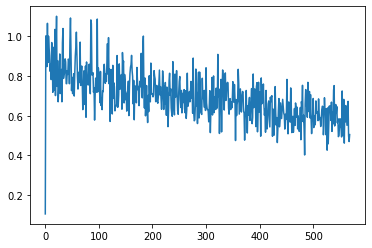

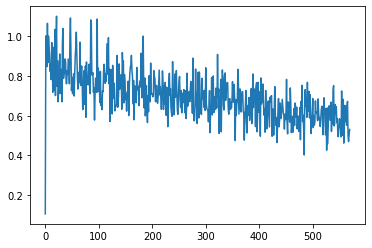

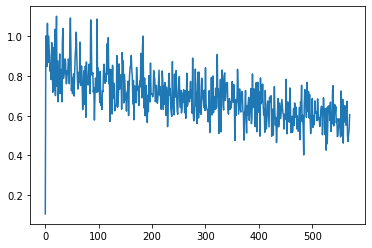

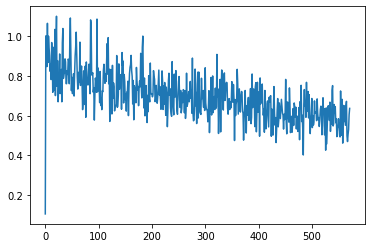

model saved version :  16.0


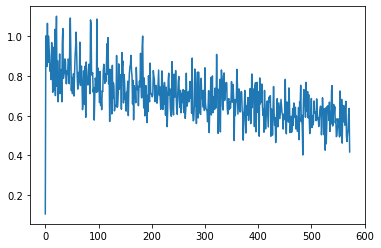

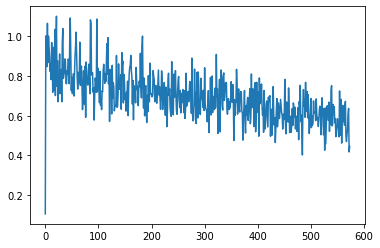

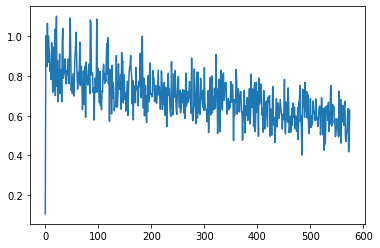

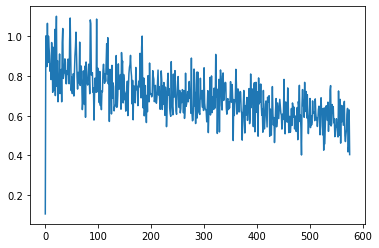

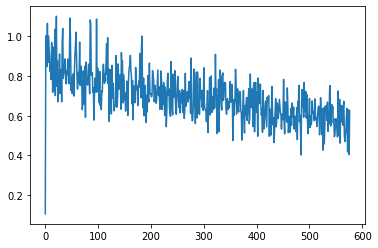

...

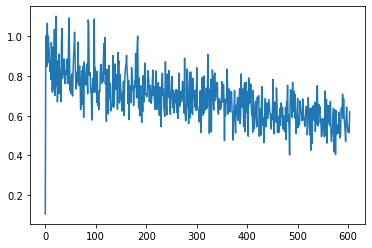

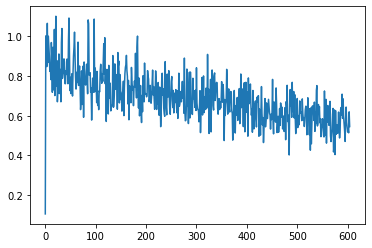

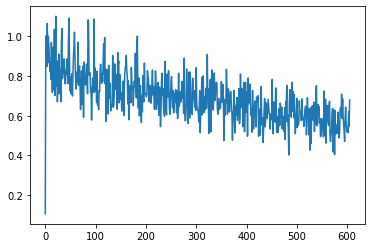

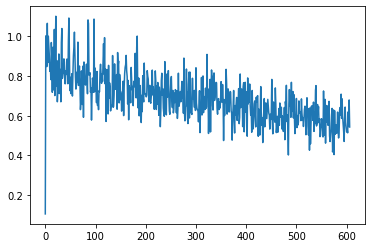

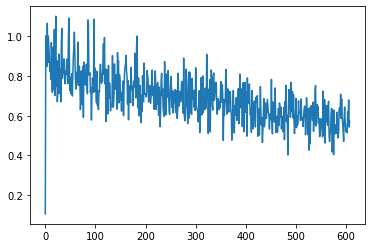

model saved version :  17.0


In [ ]:
teacher_forcing=0.7
opt=torch.optim.Adam(net_test2.parameters(),lr=0.000001)
loss_array=train_setup(net_test2,opt,n_batches=500000,batch_size=1,teacher_forcing=teacher_forcing,display_frequency=140,device=device_gpu,model_num='Translit A ')

#Test Out Model

In [45]:
def transliterate():
  import time
  while True:
    eng_word=input("Enter word in English ")
    if " " in eng_word:
      words=eng_word.split(' ')
      hin_sen=''
      for word in words:
        hin_sen+=predict(net_test2,word.upper())+" "
      print(hin_sen)
    else:
      print("The hindi trasnliterate of the word ",eng_word+"\n"+predict(net_test2,eng_word.upper()))
    cont=input("Want to generate another Transliterate (Y/N) ")
    while (cont.upper()!='Y' and cont.upper()!='N'):
      print("Wrong input.Enter correct option.")
      cont=input("Want to generate another Transliterate (Y/N) ")
    if cont.upper()=='N':
      break
    else:
      continue

transliterate()

Enter word in English zindagi na milegi dobara
ज़िंदगी न मिलीगी डोबराा 
Want to generate another Transliterate (Y/N) clock
Wrong input.Enter correct option.
Want to generate another Transliterate (Y/N) y
Enter word in English clock
The hindi trasnliterate of the word  clock
कॉक
Want to generate another Transliterate (Y/N) y
Enter word in English cricket
The hindi trasnliterate of the word  cricket
क्रिकेट
Want to generate another Transliterate (Y/N) y
Enter word in English ben stokes
बेन स्टॉक 
Want to generate another Transliterate (Y/N) n
